In [2]:
options(repr.matrix.max.cols=60, repr.matrix.max.rows=100)

In [3]:
library(tidyverse)
library(ggplot2)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.1 ──

✔ ggplot2 3.3.6     ✔ purrr   0.3.4
✔ tibble  3.1.7     ✔ dplyr   1.0.9
✔ tidyr   1.2.0     ✔ stringr 1.4.0
✔ readr   2.1.2     ✔ forcats 0.5.1

── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()



In [4]:
plotdir <- '/home/kpettie/code/github/plotting'
source(file.path(plotdir,"plotting.R"))

fontdir <- '/cashew/shared_data/fonts'
extrafont::font_import(path=fontdir, prompt=FALSE)
extrafont::choose_font('Arial')

Scanning ttf files in /cashew/shared_data/fonts ...

Extracting .afm files from .ttf files...

/cashew/shared_data/fonts/ArialMT.ttf
 : ArialMT already registered in fonts database. Skipping.

Found FontName for 0 fonts.

Scanning afm files in /opt/modules/pkgs/R/4.1.0/lib/R/library/extrafontdb/metrics



[1] "Arial"

In [19]:
outdir <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/manuscript/figs/supp'

In [6]:
filtScoresSummPairs <- function(scores,
                                score_column='ABC.Score',
                                cdt_col='ancestry',
                                cdt1='AFR',
                                cdt2='EUR',
                                groupvars=c('chr','start','end','class','TargetGene','TargetGeneTSS',
                                        'TargetGeneExpression','distance','isSelfPromoter','name',
                                        'TargetGeneIsExpressed'),
                                min_nonzero_hic=16) {

    scores <- scores %>%
        dplyr::rename(test.Score := {{score_column}},
                      condition := {{cdt_col}}) %>%
        dplyr::filter(!is.na(test.Score)) %>%
        group_by(across(all_of(groupvars))) %>%
        dplyr::filter(length(test.Score)==16,
                      sum(hic_contact > 0) >= min_nonzero_hic) %>%
        dplyr::rename(!!score_column := test.Score) %>%
        # removes downstream LFC outliers driven by a few samples with no ATAC
        # reads or with no HiC contacts in all other enhancers in 5 Mb window
        dplyr::filter(all(ABC.Score < 1),
                      all(activity_base > 0)) %>%
        dplyr::rename(test.Score := {{score_column}})

    pairsumm <- scores %>%
        summarize(test.Score_cdt1 = mean(test.Score[condition==cdt1]),
                  test.Score_cdt2 = mean(test.Score[condition==cdt2]),
                  sd_cdt1 = sd(test.Score[condition==cdt1]),
                  sd_cdt2 = sd(test.Score[condition==cdt2]),
                  n_cdt1 = sum(condition==cdt1),
                  n_cdt2 = sum(condition==cdt2)) %>%
        ungroup() %>%
        mutate(sdadj_cdt1 = if_else(sd_cdt1 < .2*test.Score_cdt1, .2*test.Score_cdt1, sd_cdt1),
               sdadj_cdt2 = if_else(sd_cdt2 < .2*test.Score_cdt2, .2*test.Score_cdt2, sd_cdt2),
               log2FoldChange = log2(test.Score_cdt2/test.Score_cdt1),
               gsea_stat = (test.Score_cdt2 - test.Score_cdt1)/sqrt(sdadj_cdt2/n_cdt2 + sdadj_cdt1/n_cdt1)) %>%
        dplyr::rename("{score_column}_{cdt1}" := test.Score_cdt1,
                      "{score_column}_{cdt2}" := test.Score_cdt2,
                      "sd_{cdt1}" := sd_cdt1,
                      "sd_{cdt2}" := sd_cdt2,
                      "n_{cdt1}" := n_cdt1,
                      "n_{cdt2}" := n_cdt2,
                      "sdadj_{cdt1}" := sdadj_cdt1,
                      "sdadj_{cdt2}" := sdadj_cdt2)

    scores <- scores %>%
        ungroup() %>%
        dplyr::rename(!!score_column := test.Score,
                      !!cdt_col := condition)

    return(list(scores=scores, pairSummary=pairsumm))

}

In [5]:
# abca_fname <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/270821output/diffABC/HiChIP/meanQN/debug/concatDecomp/allZerosFilt.meanQN.16.AFR_EUR.diff.ABC.Score.scoresAllSamps.txt.gz'
# abca <- read_tsv(abca_fname)
# abca

Rows: 9287584 Columns: 53
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (10): chr, class, TargetGene, name, CellType, sample, population, rep, q...
dbl (41): start, end, TargetGeneTSS, TargetGeneExpression, distance, powerla...
lgl  (2): isSelfPromoter, TargetGeneIsExpressed

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


chr,start,end,class,TargetGene,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,name,TargetGeneIsExpressed,powerlaw_contact,powerlaw_contact_reference,hic_contact,activity_base,atac.Score.Numerator,nEnh.atac,activity_base_sum,atac.Score,powerlaw.Score.Numerator,nEnh.ABC,powerlaw.Score,hic_enh_total,hic_tss_total,chip_estimate,nEnh.chip,chip_estimate_sum,chip_estimate_sum1,chip_estimate_adj,chip.Score,normalized_hic_contact,hic_contact_pl_scaled,hic_contact_sum,hic_contact_sum1,hic_contact_pl_scaled_adj,hic_estimate,hic_enh_total_sum,hic_tss_total_sum,hic_estimate_sum,hic_estimate_sum1,hic_estimate_adj,hic_estimate_adj_old,hic.Score.Numerator,nEnh.hic,hic.Score,ABC.Score.Numerator,ABC.Score,CellType,sample,population,rep,qnorm,ancestry
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,100009861,100010371,intergenic,LINC01708,99953360,NA,56756.0,FALSE,intergenic|chr1:100009861-100010371,FALSE,0.014915,0.014915,2,0.4226696,0.4226696,489,740.3914,0.0005708731,0.0063041165,129,0.0069590430,80.3125,87.1875,83.67942,489,65300.04,0.0012814605,0.1748941,0.0012814605,1.3750,1.3750,22.1875,0.061971831,0.27160494,0.0164317574,61647.12,11247.188,0.2154044,0.076283306,NA,1.55296776,NA,0,NA,0.11479914,0.016311022,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,100009861,100010371,intergenic,LINC01761,95940292,NA,4069824.0,FALSE,intergenic|chr1:100009861-100010371,FALSE,0.000362,0.000362,1,0.4226696,0.4226696,700,1127.3239,0.0003749318,0.0001530064,67,0.0001438016,80.3125,38.5000,55.60604,700,62572.11,0.0008886713,0.1777585,0.0008886713,0.3125,0.3125,8.3125,0.037593985,0.22727273,0.0056198935,12030.38,2579.500,0.1458341,0.038536214,NA,1.27854738,NA,0,NA,0.09606126,0.036177545,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,100009861,100010371,intergenic,PALMD,100111430,NA,101314.0,FALSE,intergenic|chr1:100009861-100010371,FALSE,0.009009,0.009009,2,0.4226696,0.4226696,481,729.5996,0.0005793171,0.0038078301,164,0.0030877357,80.3125,153.0625,110.87304,481,85367.00,0.0012987811,0.1748941,0.0012987811,1.3750,1.3750,46.5000,0.029569892,0.14965986,0.0124015716,76178.47,25102.250,0.2962460,0.041862413,NA,0.85571693,NA,0,NA,0.06325667,0.005299428,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,100022623,100023123,intergenic,LINC01787,96839681,NA,3183192.0,FALSE,intergenic|chr1:100022623-100023123,FALSE,0.000449,0.000449,0,0.4589659,0.4589659,726,1213.0356,0.0003783614,0.0002060757,53,0.0002268241,99.6250,48.0000,69.15201,726,77948.37,0.0008871514,0.1979808,0.0008871514,0.0000,0.0000,12.1875,0.000000000,0.00000000,0.0000000000,12795.41,2544.000,0.1969069,0.000000000,NA,0.00000000,NA,0,NA,0.00000000,0.000000000,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,100022623,100023123,intergenic,MIR548AA1,100154610,NA,131737.0,FALSE,intergenic|chr1:100022623-100023123,FALSE,0.007169,0.007169,1,0.4589659,0.4589659,479,729.0454,0.0006295436,0.0032903264,138,0.0022610482,99.6250,63.8125,79.73281,479,54923.05,0.0014517185,0.1947905,0.0014517185,0.3125,0.3125,15.1250,0.020661157,0.14705882,0.0039193403,73709.69,8806.125,0.1333627,0.029388575,NA,0.75495883,NA,0,NA,0.06749498,0.003492309,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,100022623,100023123,intergenic,PALMD,100111430,NA,88557.0,FALSE,intergenic|chr1:100022623-100023123,FALSE,0.010128,0.010128,0,0.4589659,0.4589659,481,729.5996,0.0006290654,0.0046484064,164,0.0037693515,99.6250,153.0625,123.48624,481,85367.00,0.0014465337,0.1947905,0.0014465337,0.0000,0.0000,46.5000,0.000000000,0.00000000,0.0000000000,76178.47,25102.250,0.2962460,0.000000000,NA,0.00000000,NA,0,NA,0.00000000,0.000000000,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,100023419,100023919,intergenic,LINC01787,96839681,NA,3183988.0,FALSE,intergenic|chr

In [ ]:
# # filter scores and get summary stats to match with t-test preds
# scorecolumn <- 'ABC.Score'
# cdt_col <- 'ancestry'
# cdt1 <- 'AFR'
# cdt2 <- 'EUR'
# groupvars <- c('chr','start','end','class','TargetGene','TargetGeneTSS',
#               'TargetGeneExpression','distance','isSelfPromoter','name',
#               'TargetGeneIsExpressed')
# repcorrgvars <- c(groupvars, 'distance', 'isSelfPromoter', score_column, 'population', 'rep')

# fsScores <- filtScoresSummPairs(abca,
#                                 score_column=scorecolumn,
#                                 cdt_col=cdt_col,
#                                 cdt1=cdt1,
#                                 cdt2=cdt2,
#                                 groupvars=groupvars,
#                                 min_nonzero_hic=min_nonzero_hic)
# abc <- fsScores$scores

In [24]:
# abc_fname <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/270821output/diffABC/HiChIP/meanQN/debug/concatDecomp/allZerosFilt.meanQN.16.AFR_EUR.diff.ABC.Score.scoresAllSamps.txt.gz'
abc_fname <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/manuscript/data/210922output/allZerosFilt.meanQN.16.AFR_EUR.diff.chip.Score.scoresAllSampsFilt.txt.gz'
wabc_olap_fname <- '/home/kpettie/nf_selection/abc/from_sherlock/abc_1000G/bqtl_topcands/050722output/overlap/allZerosFilt.meanQN.16.AFR_EUR.diff.allComponents.txt.junD.txt.gz'
d_all_fname <- '/cashew/users/kade/nextflow/selection_1000G/abc/from_sherlock/abc_1000G/manuscript/data/210922output/allZerosFilt.meanQN.16.AFR_EUR.diff.allComponents.txt.gz'

In [25]:
abc <- read_tsv(abc_fname)
head(abc)

Rows: 807648 Columns: 59
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (10): chr, class, TargetGene, name, CellType, sample, population, rep, q...
dbl (47): start, end, TargetGeneTSS, TargetGeneExpression, distance, powerla...
lgl  (2): isSelfPromoter, TargetGeneIsExpressed

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


chr,start,end,class,TargetGene,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,name,TargetGeneIsExpressed,powerlaw_contact,powerlaw_contact_reference,hic_contact,activity_base,atac.Score.Numerator,nEnh.atac,activity_base_sum,atac.Score,powerlaw.Score.Numerator,nEnh.ABC,powerlaw.Score,hic_enh_total,hic_tss_total,chip_estimate,nEnh.chip,chip_estimate_sum,chip_estimate_sum1,chip_estimate_adj,chip.Score,normalized_hic_contact,hic_contact_pl_scaled,hic_contact_sum,hic_contact_sum1,hic_contact_pl_scaled_adj,hic_estimate,hic_enh_total_sum,hic_tss_total_sum,hic_estimate_sum,hic_estimate_sum1,hic_estimate_adj,hic_estimate_adj_old,hic.Score.Numerator,nEnh.hic,hic.Score,activity_estimate,nEnh.activity,activity_estimate_sum,activity_estimate_sum1,activity_estimate_adj,activity.Score,ABC.Score.Numerator,ABC.Score,CellType,sample,population,rep,qnorm,ancestry
<chr>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,10003167,10003735,promoter,LZIC,10003485,7.781197,34,TRUE,promoter|chr1:10003167-10003735,TRUE,0.123436,0.123436,52,17.147390,17.147390,1908,2412.719,0.007107080,2.11660521,966,0.315337082,716.875,716.8750,716.8750,1912,707767.3,0.001012868,0.4514388,0.001012868,35.4375,35.4375,527.2500,0.06721195,1.0000000,0.04943330,347948.5,692501.2,1.0744029,0.04601002,0.6202506,2.2151397,0.6202506,966,0.04601002,110.87171,966,21637.55,0.005124041,0.4325255,0.005124041,17.147390,0.29061512,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10003167,10003735,promoter,NMNAT1,10003485,4.698655,34,TRUE,promoter|chr1:10003167-10003735,TRUE,0.123436,0.123436,52,17.147390,17.147390,1908,2412.719,0.007107080,2.11660521,966,0.315337082,716.875,716.8750,716.8750,1912,707767.3,0.001012868,0.4514388,0.001012868,35.4375,35.4375,527.2500,0.06721195,1.0000000,0.04943330,347948.5,692501.2,1.0744029,0.04601002,0.6202506,2.2151397,0.6202506,966,0.04601002,110.87171,966,21637.55,0.005124041,0.4325255,0.005124041,17.147390,0.29061512,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10003167,10003735,promoter,UBE4B,10093040,11.397529,89589,FALSE,promoter|chr1:10003167-10003735,TRUE,0.010027,0.010027,16,17.147390,17.147390,1915,2419.048,0.007088488,0.17193688,989,0.023931513,716.875,624.5625,669.1287,1919,662926.2,0.001009356,0.4514388,0.001009356,10.9375,10.9375,421.1875,0.02596824,0.2831715,0.01634588,347581.8,617692.3,0.9081677,0.01799875,0.2643841,0.6272645,0.2643841,989,0.01799875,107.11588,989,21019.35,0.005096061,0.4325255,0.005096061,4.855652,0.09668656,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10010314,10010816,genic,LZIC,10003485,7.781197,7080,FALSE,genic|chr1:10010314-10010816,TRUE,0.091209,0.091209,43,3.733244,3.733244,1908,2412.719,0.001547318,0.34050546,966,0.050729347,733.250,716.8750,725.0163,1912,707767.3,0.001024371,0.4565656,0.001024371,31.3125,31.3125,527.2500,0.05938834,0.8835979,0.04318869,347948.5,692501.2,1.0744029,0.04019785,0.5418980,1.9353141,0.5418980,966,0.04019785,52.02560,966,21637.55,0.002404412,0.2029589,0.002404412,3.298687,0.05590636,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10010314,10010816,genic,NMNAT1,10003485,4.698655,7080,FALSE,genic|chr1:10010314-10010816,TRUE,0.091209,0.091209,43,3.733244,3.733244,1908,2412.719,0.001547318,0.34050546,966,0.050729347,733.250,716.8750,725.0163,1912,707767.3,0.001024371,0.4565656,0.001024371,31.3125,31.3125,527.2500,0.05938834,0.8835979,0.04318869,347948.5,692501.2,1.0744029,0.04019785,0.5418980,1.9353141,0.5418980,966,0.04019785,52.02560,966,21637.55,0.002404412,0.2029589,0.002404412,3.298687,0.05590636,CEU_rep1.meanQN,CEU_rep1,CEU,rep1,meanQN,EUR
chr1,10010314,10010816,genic,UBE4B,10093040,11.397529,82475,FALSE,genic|chr1:10010314-10010816,TRUE,0.010775,0.010775,23,3

In [26]:
crebqtl <- read_tsv(wabc_olap_fname) %>% 
    select(hgnc_symbol,name,seqnames,start,end,contains(c('bqtl','monodirection'))) %>% 
    rename(TargetGene=hgnc_symbol) %>% 
    group_by(TargetGene, name) %>% 
    arrange(bqtl_p) %>% 
    slice(1) %>% 
    ungroup()
crebqtl

Rows: 50733 Columns: 106
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr (50): hgnc_symbol, name, bqtl_pos_all, bqtl_alt_affinity, bqtl_alt_high_...
dbl (53): TargetGeneTSS, distance, mean_ABC, width, rank2_percentile, fst_pe...
lgl  (3): bqtl_concordance, isSelfPromoter, eqtl_concordance

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


TargetGene,name,seqnames,start,end,bqtl_pos,bqtl_pos_all,bqtl_alt_affinity,bqtl_alt_high_freq,bqtl_concordance,bqtl_p,bqtl_AFR_alt_frq,bqtl_EUR_alt_frq,bqtl_fst,bqtl_fst_percentile,bqtl_N,bqtl_fst_percentile_all,bqtl_alt_affinity_all,bqtl_alt_high_freq_all,bqtl_direction,atac_monodirection,chip_monodirection,hic_monodirection
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
A1BG,promoter|chr19:58873687-58874464,chr19,58873687,58874464,58874262,58874262,high,AFR,TRUE,3.650281e-02,0.10381900,0.00000000,0.10197300,0.9011235,1,0.901123503792627,high,AFR,down,down,down,down
A1BG-AS1,promoter|chr19:58873687-58874464,chr19,58873687,58874464,58874262,58874262,high,AFR,TRUE,3.650281e-02,0.10381900,0.00000000,0.10197300,0.9011235,1,0.901123503792627,high,AFR,down,down,down,down
A2M,genic|chr12:9255999-9256499,chr12,9255999,9256499,9256219,9256219,high,AFR,TRUE,1.837687e-06,0.22911700,0.17718400,0.00704739,0.5232834,1,0.523283406309579,high,AFR,down,up,down,down
A2M,intergenic|chr12:9270729-9271300,chr12,9270729,9271300,9270989,NA,high,AFR,NA,1.584941e-01,0.09069210,0.00606796,0.07319840,0.8657801,0,NA,NA,NA,NA,down,down,up
A4GALT,promoter|chr22:43116666-43117166,chr22,43116666,43117166,43117037,NA,high,AFR,NA,1.555371e-01,0.39379500,0.36165000,0.00100302,0.2113085,0,NA,NA,NA,NA,down,down,down
AA06,promoter|chr17:31860529-31861029,chr17,31860529,31861029,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,up,down,up
AAAS,genic|chr12:53886720-53887220,chr12,53886720,53887220,53886755,NA,low,AFR,NA,1.127607e-01,0.04415270,0.00000000,0.04269980,0.8003230,0,NA,NA,NA,NA,down,down,up
AAAS,intergenic|chr12:53602620-53603120,chr12,53602620,53603120,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,up,up,down
AAAS,intergenic|chr12:53718446-53718946,chr12,53718446,53718946,53718446,NA,high,NA,NA,4.289026e-01,NA,NA,NA,NA,0,NA,NA,NA,NA,down,up,up


In [27]:
d_all <- read_tsv(d_all_fname) %>% 
    select(TargetGene, name, seqnames, start, end, log2FoldChange, p, score_type) %>% 
    rename(lfc = log2FoldChange) %>% 
    pivot_wider(names_from=score_type,
                names_glue="{score_type}_{.value}",
                values_from=c('lfc','p'))
d_all

Rows: 201912 Columns: 34
── Column specification ────────────────────────────────────────────────────────
Delimiter: "\t"
chr  (9): seqnames, strand, class, TargetGene, name, group1, group2, score_t...
dbl (22): start, end, width, TargetGeneTSS, TargetGeneExpression, distance, ...
lgl  (3): isSelfPromoter, TargetGeneIsExpressed, selection_candidate

ℹ Use `spec()` to retrieve the full column specification for this data.
ℹ Specify the column types or set `show_col_types = FALSE` to quiet this message.


TargetGene,name,seqnames,start,end,ABC_lfc,atac_lfc,chip_lfc,hic_lfc,ABC_p,atac_p,chip_p,hic_p
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
A1BG,promoter|chr19:58873687-58874464,chr19,58873687,58874464,-0.106095246,-0.0152726777,-0.042241305,-0.141173347,0.6010,0.52400,0.0762,0.7420
A1BG-AS1,promoter|chr19:58873687-58874464,chr19,58873687,58874464,-0.106095246,-0.0152648094,-0.042379201,-0.141173347,0.6010,0.52400,0.0756,0.7420
A2M,genic|chr12:9255999-9256499,chr12,9255999,9256499,0.151798305,0.0456485572,-0.129312557,-0.255633252,0.8210,0.71000,0.0937,0.5330
A2M,intergenic|chr12:9270729-9271300,chr12,9270729,9271300,0.515674798,-0.1392793992,-0.017808399,0.014363379,0.4160,0.15500,0.8450,0.9680
A4GALT,promoter|chr22:43116666-43117166,chr22,43116666,43117166,0.039418279,-0.0951679604,-0.044468179,-0.016303149,0.9080,0.12800,0.5980,0.9220
AA06,promoter|chr17:31860529-31861029,chr17,31860529,31861029,1.437023150,0.3018848792,-0.028209590,0.305726636,0.2580,0.30900,0.8110,0.5520
AAAS,genic|chr12:53886720-53887220,chr12,53886720,53887220,0.564657735,-0.0005002466,-0.022516032,0.372758918,0.2780,0.99100,0.6210,0.2420
AAAS,intergenic|chr12:53602620-53603120,chr12,53602620,53603120,0.030767331,0.0789116281,0.094602721,-0.197530608,0.9140,0.13200,0.1440,0.4290
AAAS,intergenic|chr12:53718446-53718946,chr12,53718446,53718946,0.061397663,-0.0350848524,0.039035168,0.073565549,0.7540,0.02660,0.3670,0.6980


In [28]:
d_all %>% 
    filter(ABC_p<0.05, ABC_lfc>0) %>% 
    pull(name) %>% 
    n_distinct()

[1] 1184

In [29]:
d_all %>% 
    filter(ABC_p<0.05, ABC_lfc<0) %>% 
    pull(name) %>% 
    n_distinct()

[1] 1122

In [30]:
2911/50478

[1] 0.05766869

In [31]:
wabcb <- merge(d_all, crebqtl) %>% 
    rename(chr=seqnames)
wabcb

TargetGene,name,chr,start,end,ABC_lfc,atac_lfc,chip_lfc,hic_lfc,ABC_p,atac_p,chip_p,hic_p,bqtl_pos,bqtl_pos_all,bqtl_alt_affinity,bqtl_alt_high_freq,bqtl_concordance,bqtl_p,bqtl_AFR_alt_frq,bqtl_EUR_alt_frq,bqtl_fst,bqtl_fst_percentile,bqtl_N,bqtl_fst_percentile_all,bqtl_alt_affinity_all,bqtl_alt_high_freq_all,bqtl_direction,atac_monodirection,chip_monodirection,hic_monodirection
<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
A1BG,promoter|chr19:58873687-58874464,chr19,58873687,58874464,-0.106095246,-0.0152726777,-0.042241305,-0.141173347,0.6010,0.52400,0.0762,0.7420,58874262,58874262,high,AFR,TRUE,3.650281e-02,0.10381900,0.00000000,0.10197300,0.9011235,1,0.901123503792627,high,AFR,down,down,down,down
A1BG-AS1,promoter|chr19:58873687-58874464,chr19,58873687,58874464,-0.106095246,-0.0152648094,-0.042379201,-0.141173347,0.6010,0.52400,0.0756,0.7420,58874262,58874262,high,AFR,TRUE,3.650281e-02,0.10381900,0.00000000,0.10197300,0.9011235,1,0.901123503792627,high,AFR,down,down,down,down
A2M,genic|chr12:9255999-9256499,chr12,9255999,9256499,0.151798305,0.0456485572,-0.129312557,-0.255633252,0.8210,0.71000,0.0937,0.5330,9256219,9256219,high,AFR,TRUE,1.837687e-06,0.22911700,0.17718400,0.00704739,0.5232834,1,0.523283406309579,high,AFR,down,up,down,down
A2M,intergenic|chr12:9270729-9271300,chr12,9270729,9271300,0.515674798,-0.1392793992,-0.017808399,0.014363379,0.4160,0.15500,0.8450,0.9680,9270989,NA,high,AFR,NA,1.584941e-01,0.09069210,0.00606796,0.07319840,0.8657801,0,NA,NA,NA,NA,down,down,up
A4GALT,promoter|chr22:43116666-43117166,chr22,43116666,43117166,0.039418279,-0.0951679604,-0.044468179,-0.016303149,0.9080,0.12800,0.5980,0.9220,43117037,NA,high,AFR,NA,1.555371e-01,0.39379500,0.36165000,0.00100302,0.2113085,0,NA,NA,NA,NA,down,down,down
AA06,promoter|chr17:31860529-31861029,chr17,31860529,31861029,1.437023150,0.3018848792,-0.028209590,0.305726636,0.2580,0.30900,0.8110,0.5520,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,up,down,up
AAAS,genic|chr12:53886720-53887220,chr12,53886720,53887220,0.564657735,-0.0005002466,-0.022516032,0.372758918,0.2780,0.99100,0.6210,0.2420,53886755,NA,low,AFR,NA,1.127607e-01,0.04415270,0.00000000,0.04269980,0.8003230,0,NA,NA,NA,NA,down,down,up
AAAS,intergenic|chr12:53602620-53603120,chr12,53602620,53603120,0.030767331,0.0789116281,0.094602721,-0.197530608,0.9140,0.13200,0.1440,0.4290,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,up,up,down
AAAS,intergenic|chr12:53718446-53718946,chr12,53718446,53718946,0.061397663,-0.0350848524,0.039035168,0.073565549,0.7540,0.02660,0.3670,0.6980,53718446,NA,high,NA,NA,4.289026e-01,NA,NA,NA,NA,0,NA,NA,NA,NA,down,up,up


In [32]:
intersect(colnames(abc), colnames(wabcb))

[1] "chr"        "start"      "end"        "TargetGene" "name"

In [33]:
abcp <- merge(abc, wabcb)
abcp

chr,start,end,TargetGene,name,class,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,TargetGeneIsExpressed,powerlaw_contact,powerlaw_contact_reference,hic_contact,activity_base,atac.Score.Numerator,nEnh.atac,activity_base_sum,atac.Score,powerlaw.Score.Numerator,nEnh.ABC,powerlaw.Score,hic_enh_total,hic_tss_total,chip_estimate,nEnh.chip,chip_estimate_sum,chip_estimate_sum1,chip_estimate_adj,chip.Score,⋯,population,rep,qnorm,ancestry,ABC_lfc,atac_lfc,chip_lfc,hic_lfc,ABC_p,atac_p,chip_p,hic_p,bqtl_pos,bqtl_pos_all,bqtl_alt_affinity,bqtl_alt_high_freq,bqtl_concordance,bqtl_p,bqtl_AFR_alt_frq,bqtl_EUR_alt_frq,bqtl_fst,bqtl_fst_percentile,bqtl_N,bqtl_fst_percentile_all,bqtl_alt_affinity_all,bqtl_alt_high_freq_all,bqtl_direction,atac_monodirection,chip_monodirection,hic_monodirection
<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,52,17.147390,17.147390,1908,2412.719,0.007107080,2.1166052,966,0.31533708,716.8750,716.8750,716.8750,1912,707767.3,0.0010128683,0.4514388,0.0010128683,⋯,CEU,rep1,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.04996780,0.130,1.72e-06,0.00450,0.780,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.8240290,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,128,15.728868,15.728868,1908,2403.804,0.006543324,1.9415086,966,0.29477934,668.6875,668.6875,668.6875,1912,688511.0,0.0009712081,0.3695533,0.0009712081,⋯,YRI,rep1,meanQN,AFR,0.2294113,0.1905718,0.09041172,0.04996780,0.130,1.72e-06,0.00450,0.780,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.8240290,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,14,15.392206,15.392206,1908,2481.823,0.006201977,1.8999524,966,0.28848017,739.5625,739.5625,739.5625,1912,738369.7,0.0010016154,0.3886448,0.0010016154,⋯,GWD,rep1,meanQN,AFR,0.2294113,0.1905718,0.09041172,0.04996780,0.130,1.72e-06,0.00450,0.780,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.8240290,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,40,17.579358,17.579358,1908,2563.759,0.006856869,2.1699256,966,0.30551855,805.5938,805.5938,805.5938,1912,761589.1,0.0010577800,0.3997120,0.0010577800,⋯,IBS,rep1,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.04996780,0.130,1.72e-06,0.00450,0.780,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.8240290,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,57,18.358908,18.358908,1908,2557.342,0.007178901,2.2661501,966,0.31471539,857.3125,857.3125,857.3125,1912,793704.6,0.0010801406,0.4157532,0.0010801406,⋯,IBS,rep2,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.04996780,0.130,1.72e-06,0.00450,0.780,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.8240290,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,7,18.584529,18.584529,1908,2447.922,0.007591961,2.2939999,966,0.33148433,928.3750,928.3750,928.3750,1912,821745.5,0.0011297597,0.4170691,0.0011297597,⋯,CEU,rep2,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.04996780,0.130,1.72e-06,0.00450,0.780,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.8240290,

# PCA function

In [34]:
head(abcp, 4)

,chr,start,end,TargetGene,name,class,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,TargetGeneIsExpressed,powerlaw_contact,powerlaw_contact_reference,hic_contact,activity_base,atac.Score.Numerator,nEnh.atac,activity_base_sum,atac.Score,powerlaw.Score.Numerator,nEnh.ABC,powerlaw.Score,hic_enh_total,hic_tss_total,chip_estimate,nEnh.chip,chip_estimate_sum,chip_estimate_sum1,chip_estimate_adj,chip.Score,⋯,population,rep,qnorm,ancestry,ABC_lfc,atac_lfc,chip_lfc,hic_lfc,ABC_p,atac_p,chip_p,hic_p,bqtl_pos,bqtl_pos_all,bqtl_alt_affinity,bqtl_alt_high_freq,bqtl_concordance,bqtl_p,bqtl_AFR_alt_frq,bqtl_EUR_alt_frq,bqtl_fst,bqtl_fst_percentile,bqtl_N,bqtl_fst_percentile_all,bqtl_alt_affinity_all,bqtl_alt_high_freq_all,bqtl_direction,atac_monodirection,chip_monodirection,hic_monodirection
,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,52,17.14739,17.14739,1908,2412.719,0.007107080,2.116605,966,0.3153371,716.8750,716.8750,716.8750,1912,707767.3,0.0010128683,0.4514388,0.0010128683,⋯,CEU,rep1,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
2,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,128,15.72887,15.72887,1908,2403.804,0.006543324,1.941509,966,0.2947793,668.6875,668.6875,668.6875,1912,688511.0,0.0009712081,0.3695533,0.0009712081,⋯,YRI,rep1,meanQN,AFR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
3,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,14,15.39221,15.39221,1908,2481.823,0.006201977,1.899952,966,0.2884802,739.5625,739.5625,739.5625,1912,738369.7,0.0010016154,0.3886448,0.0010016154,⋯,GWD,rep1,meanQN,AFR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
4,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,40,17.57936,17.57936,1908,2563.759,0.006856869,2.169926,966,0.3055185,805.5938,805.5938,805.5938,1912,761589.1,0.0010577800,0.3997120,0.0010577800,⋯,IBS,rep1,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up


In [35]:
str_split('ABC.Score', '\\.', simplify=TRUE)[1]

[1] "ABC"

In [36]:
length(c('promoter','enhancer'))

[1] 2

In [37]:
sampScorePCA <- function(df, 
                         score_columns=c('ABC.Score','atac.Score','chip.Score','hic.Score'),
                         scale=FALSE, 
                         zscore=FALSE,
                         topvar=NULL,
                         cre_types_list=list(c('promoter','enhancer'), 'promoter', 'enhancer'),
                         frows=3,
                         fdir='h',
                         fscales='free',
                         top_abc=FALSE,
                         diff_cres=FALSE,
                         top_diff=FALSE,
                         bqtl=FALSE,
                         bqtl_direction=FALSE,
                         cre_type_first=TRUE,
                         plotlog=FALSE,
                         hic_filt=FALSE,
                         ordervar='mean_score',
                         cv_exclude_pop=NULL,
                         debug=FALSE) {
    
    sampinfo <- df %>% 
        select(ancestry,population,sample,rep) %>% 
        rename(replicate=rep) %>% 
        distinct()
    
    df <- df %>% 
        mutate(egpair = paste(name, TargetGene, sep=';'),
               CRE_type = if_else(class=='promoter','promoter','enhancer'))
    
    
    agg_pc_eigenvalues <- tibble()
    agg_pc_scores <- tibble()
    
    for (score_column in score_columns) {
        for (cre_types in cre_types_list) {
            
            print(score_column)
            print(cre_types)
            
            cscore_type <- str_split(score_column, '\\.', simplify=TRUE)[1]
            cscore_pcol <- paste0(cscore_type, '_p')
            cscore_lfccol <- paste0(cscore_type, '_lfc')
            
            abcw <- df
            
            if (cre_type_first) {
                
                print('    CRE type filtering')
                
                abcw <- abcw %>% 
                    dplyr::filter(CRE_type %in% cre_types)
                
            }
            
            if (hic_filt) {
        
                abcw <- abcw %>% 
                    # for compatibility with previous bug, 
                    # remove NA hic_estimates for all score types
                    group_by(egpair) %>% 
                    filter(all(!is.na(hic.Score)))

            }

            if (top_abc) {

                abcw <- abcw %>% 
                    group_by(egpair) %>% 
                    mutate(mean_ABC = mean(ABC.Score, na.rm=TRUE)) %>% 
                    group_by(sample, TargetGene) %>% 
                    arrange(desc(mean_ABC), .by_group=TRUE) %>% 
                    slice(1)

            }

            abcw <- abcw %>% 
                ungroup() %>% 
                rename(test.Score := {{score_column}},
                       test.p := {{cscore_pcol}},
                       test.lfc := {{cscore_lfccol}})
            
            if (diff_cres) {
                print('    filtering to diff pairs')
                print(paste0('        ', nrow(abcw)))
                abcw <- abcw %>% 
                    filter(test.p < 0.05)
                print(paste0('        ', nrow(abcw)))
            }
            
            if (bqtl) {
                
                abcw <- abcw %>% 
                    filter(bqtl_p < 0.05)
                
                if (grepl('chip', score_column) | grepl('hic', score_column)) {
                  # only count each HiChIP bin once
                  abcw <- abcw %>%
                        group_by(sample, TargetGene, name) %>%
                        arrange(bqtl_p, .by_group=TRUE) %>%
                        slice(1) %>%
                        ungroup() %>%
                        group_by(sample, TargetGene, test.lfc, ABC_p) %>%
                        mutate(chipbin_has_promoter = if_else(any(class=='promoter'), TRUE, FALSE))

                    # take the CRE with the most significant QTL in the HiChIP bin
                    abcw <- abcw %>%
                        arrange(bqtl_p, .by_group=TRUE) %>%
                        slice(1) %>%
                        ungroup() 
                        
                }
                
            } else if (top_diff) {
                
                print('    filtering to top-diff pairs')
                abcw <- abcw %>% 
                    group_by(sample, TargetGene) %>% 
                    arrange(test.p) %>% 
                    slice(1) %>% 
                    ungroup()
                
            }
            
            if (!cre_type_first) {
                
                print('    CRE type filtering')
                
                if (length(cre_types)==1 
                        & bqtl 
                        & (grepl('chip', score_column) | grepl('hic', score_column))) {
                    
                    if (cre_types=='promoter') {
                        abcw <- abcw %>% dplyr::filter(chipbin_has_promoter)
                    } else if (cre_types=='enhancer') {
                        abcw <- abcw %>% dplyr::filter(!chipbin_has_promoter)
                    }
                    
                } else {
                    abcw <- abcw %>% 
                        dplyr::filter(CRE_type %in% cre_types)
                }
                
            }
            
            if (bqtl) {

                # take the most significantly differential E-G pair per CRE
                abcw <- abcw %>% 
                    group_by(sample, name) %>% 
                    arrange(bqtl_p, test.p, .by_group=TRUE) %>% 
                    slice(1) %>% 
                    ungroup()

                if (bqtl_direction) {
                    abcw <- abcw %>% 
                        filter((test.lfc > 0 & bqtl_direction=='up') 
                                  | (test.lfc < 0 & bqtl_direction=='down'))
                }

            }
            
            # process for PCA
            abcw <- abcw %>% 
                select(sample, CRE_type, egpair, test.Score) %>% 
                group_by(egpair) %>% 
                mutate(mean_score=mean(test.Score, na.rm=TRUE))
            
            # allow coefficient of variance calculation for E-G pair inclusion filtering
            # to exclude single pop/sample that could driving the top CV pairs
            if (!is.null(cv_exclude_pop)) {
                abcw <- abcw %>% 
                    mutate(test_cv = sd(test.Score[population!=cv_exclude_pop], na.rm=TRUE)/mean(test.Score[population!=cv_exclude_pop], na.rm=TRUE))
            } else {
                abcw <- abcw %>% 
                    mutate(test_cv = sd(test.Score, na.rm=TRUE)/mean_score)
            }
            
            if (zscore) {
                abcw <- abcw %>% 
                    mutate(test.Score = (test.Score - mean_score)/sd(test.Score, na.rm=TRUE))
            }
            
            abcw <- abcw %>% 
                ungroup() %>% 
                pivot_wider(names_from = sample,
                            values_from = test.Score) %>% 
                filter(if_all(everything(), ~ !is.na(.)))

            if (!is.null(topvar)) {

                abcw <- abcw %>% 
                    arrange(desc(test_cv)) %>% 
                    head(topvar)

            }

            abcw <- abcw %>% 
                arrange(desc(.data[[ordervar]]))

            if (debug) return(abcw)

            abcw <- abcw %>% 
                select(-c(CRE_type, mean_score, test_cv))


            abcwt <- abcw %>% 
                column_to_rownames("egpair") %>% 
                as.matrix() %>% 
                t()

            print(paste("Running PCA on", ncol(abcwt), "E-G pairs"))

            if (plotlog) abcwt <- log(abcwt)
            abcpca <- prcomp(abcwt, scale.=scale)
            
            # set variables for facet_wrap plotting
            cct <- paste0(cre_types, 's')
            if (length(cre_types)>1) cct <- 'all CREs'
            if (grepl('ABC',score_column)) csc <- 'ABC'
            if (grepl('atac',score_column)) csc <- 'ATAC'
            if (grepl('chip',score_column)) csc <- 'ChIP'
            if (grepl('hic',score_column)) csc <- 'HiC'

            pc_eigenvalues <- abcpca$sdev^2
            pc_eigenvalues <- tibble(PC = factor(1:length(pc_eigenvalues)), 
                                     variance = pc_eigenvalues) %>% 
                mutate(pct = variance/sum(variance)*100,
                       pct_cum = cumsum(pct),
                       CRE_type = cct,
                       score_type = csc)
            
            
            pclrs <- popPlotColors(pops=unique(sampinfo$population)) %>% 
                mutate(porder=1:nrow(.))
            r1colors <- pclrs %>% 
                dplyr::filter(replicate=='rep1')

            pc_scores <- abcpca$x
            pc_scores <- pc_scores %>% 
                as_tibble(rownames = "sample") %>% 
                merge(., sampinfo) %>% 
                merge(., pclrs) %>% 
                mutate(sample = factor(sample, levels=pclrs$sample),
                           population = factor(population, levels=r1colors$population),
                           hex = factor(hex, levels=r1colors$hex),
                       replicate = gsub('rep','',replicate)) %>% 
                arrange(desc(porder)) %>% 
                mutate(CRE_type = cct,
                       score_type = csc)
            
            agg_pc_eigenvalues <- rbind(agg_pc_eigenvalues, pc_eigenvalues)
            agg_pc_scores <- rbind(agg_pc_scores, pc_scores)

        }
    }
    
    
    ppce <- agg_pc_eigenvalues %>% 
        ggplot(aes(x = PC)) +
        geom_col(aes(y = pct)) +
        geom_line(aes(y = pct_cum, group = 1)) + 
        geom_point(aes(y = pct_cum)) +
        labs(
#             title=ptitle, 
            x = "PC", 
            y = "Variance explained (%)") + 
        facet_wrap(vars(CRE_type, score_type), nrow=frows, dir=fdir, scales=fscales) + 
        theme_classic() +
        theme(axis.text.x = element_text(size=18),
              axis.text.y = element_text(size=20),
              axis.ticks.length.x = unit(0.75, "line"),
              axis.title.x = element_text(size=22),
              axis.title.y = element_text(size=22),
                  strip.background = element_blank(),
                  strip.placement = "outside",
                  strip.text = element_text(size=22),
              panel.background = element_rect(fill = "transparent",colour = NA),
              plot.title = element_text(size=24),
              plot.background = element_rect(fill = "transparent",colour = NA),
              plot.margin = unit(c(0,0,0,0),"line"))
    
    
    ppca <- agg_pc_scores %>%  
        ggplot(aes(x = PC1, y = PC2, color=hex)) +
        geom_point(size=2) + 
        scale_color_identity(breaks=pc_scores$hex, labels=pc_scores$population, guide='legend') +  
        labs(
#             title=ptitle, 
#              x = paste0("PC1 (", 
#                         round(pc_eigenvalues[pc_eigenvalues$PC=='1', 'pct'][[1]], 1),
#                         "% of variance)"),
#              y = paste0("PC2 (", 
#                         round(pc_eigenvalues[pc_eigenvalues$PC=='2', 'pct'][[1]], 1),
#                         "% of variance)"),
             color='Population') + 
        ggrepel::geom_text_repel(
                aes(label=replicate, color='gray'),
                size=4,
                show.legend=FALSE,
                box.padding=.075
#                 hjust='left',
#                 direction="y",
#                 segment.alpha=0
            ) + 
#         facet_wrap(vars(CRE_type, score_type), nrow=frows, dir=fdir, scales=fscales) + 
        facet_grid(score_type ~ CRE_type, scales=fscales) +
        theme_classic() +
        theme(axis.text.x = element_text(size=18),
              axis.text.y = element_text(size=18),
              axis.ticks.length.x = unit(0.75, "line"),
              axis.title.x = element_text(size=22),
              axis.title.y = element_text(size=22),
              legend.position = 'right',
              legend.title = element_text(size=20),
              legend.text = element_text(size=18),
              legend.key.size = unit(2.0, "line"),
              legend.background = element_rect(fill = "transparent",colour = NA),
              legend.box.background = element_rect(fill = "transparent",colour = NA),
                  strip.background = element_blank(),
                  strip.placement = "outside",
                  strip.text = element_text(size=22),
              panel.background = element_rect(fill = "transparent",colour = NA),
              plot.title=element_text(size=24),
              plot.background = element_rect(fill = "transparent",colour = NA),
              plot.margin = unit(c(0,0,0,0),"line"))
    
    return(list(ev=agg_pc_eigenvalues, scores=agg_pc_scores, evplot=ppce, pcaplot=ppca))
}

# Fig. S1

## args

In [38]:
pca_only <- FALSE
topvarN <- NULL

diff_cres <- FALSE
top_diff <- FALSE
bqtl <- FALSE
bqtl_direction <- FALSE

cre_type_first <- FALSE

colClust <- TRUE
scale_direction <- 'none'
zscore <- TRUE
cv_exclude_pop <- 'CEU'
save_figs <- TRUE

## a

In [39]:
head(abcp)

,chr,start,end,TargetGene,name,class,TargetGeneTSS,TargetGeneExpression,distance,isSelfPromoter,TargetGeneIsExpressed,powerlaw_contact,powerlaw_contact_reference,hic_contact,activity_base,atac.Score.Numerator,nEnh.atac,activity_base_sum,atac.Score,powerlaw.Score.Numerator,nEnh.ABC,powerlaw.Score,hic_enh_total,hic_tss_total,chip_estimate,nEnh.chip,chip_estimate_sum,chip_estimate_sum1,chip_estimate_adj,chip.Score,⋯,population,rep,qnorm,ancestry,ABC_lfc,atac_lfc,chip_lfc,hic_lfc,ABC_p,atac_p,chip_p,hic_p,bqtl_pos,bqtl_pos_all,bqtl_alt_affinity,bqtl_alt_high_freq,bqtl_concordance,bqtl_p,bqtl_AFR_alt_frq,bqtl_EUR_alt_frq,bqtl_fst,bqtl_fst_percentile,bqtl_N,bqtl_fst_percentile_all,bqtl_alt_affinity_all,bqtl_alt_high_freq_all,bqtl_direction,atac_monodirection,chip_monodirection,hic_monodirection
,<chr>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<lgl>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<lgl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
1,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,52,17.14739,17.14739,1908,2412.719,0.007107080,2.116605,966,0.3153371,716.8750,716.8750,716.8750,1912,707767.3,0.0010128683,0.4514388,0.0010128683,⋯,CEU,rep1,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
2,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,128,15.72887,15.72887,1908,2403.804,0.006543324,1.941509,966,0.2947793,668.6875,668.6875,668.6875,1912,688511.0,0.0009712081,0.3695533,0.0009712081,⋯,YRI,rep1,meanQN,AFR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
3,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,14,15.39221,15.39221,1908,2481.823,0.006201977,1.899952,966,0.2884802,739.5625,739.5625,739.5625,1912,738369.7,0.0010016154,0.3886448,0.0010016154,⋯,GWD,rep1,meanQN,AFR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
4,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,40,17.57936,17.57936,1908,2563.759,0.006856869,2.169926,966,0.3055185,805.5938,805.5938,805.5938,1912,761589.1,0.0010577800,0.3997120,0.0010577800,⋯,IBS,rep1,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
5,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,57,18.35891,18.35891,1908,2557.342,0.007178901,2.266150,966,0.3147154,857.3125,857.3125,857.3125,1912,793704.6,0.0010801406,0.4157532,0.0010801406,⋯,IBS,rep2,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,high,EUR,up,up,up,up
6,chr1,10003167,10003735,LZIC,promoter|chr1:10003167-10003735,promoter,10003485,7.781197,34,TRUE,TRUE,0.123436,0.123436,7,18.58453,18.58453,1908,2447.922,0.007591961,2.294000,966,0.3314843,928.3750,928.3750,928.3750,1912,821745.5,0.0011297597,0.4170691,0.0011297597,⋯,CEU,rep2,meanQN,EUR,0.2294113,0.1905718,0.09041172,0.0499678,0.13,1.72e-06,0.0045,0.78,10003320,10003320,high,EUR,TRUE,0.03440471,0.143198,0.824029,0.633586,0.9991313,1,0.99913128144732,hi

In [40]:
pca_abc <- sampScorePCA(abcp, 
                        scale=FALSE,
                        zscore=zscore,
                        topvar=topvarN,
                        top_abc=FALSE,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                        diff_cres=diff_cres,
                        top_diff=top_diff,
                        cre_type_first=cre_type_first,
                        plotlog=FALSE,
                        hic_filt=FALSE,
                        ordervar='mean_score',
                        cv_exclude_pop=cv_exclude_pop,
                        debug=FALSE)
                         

[1] "ABC.Score"
[1] "promoter" "enhancer"
[1] "    CRE type filtering"
[1] "Running PCA on 50478 E-G pairs"
[1] "ABC.Score"
[1] "promoter"
[1] "    CRE type filtering"
[1] "Running PCA on 23616 E-G pairs"
[1] "ABC.Score"
[1] "enhancer"
[1] "    CRE type filtering"
[1] "Running PCA on 26862 E-G pairs"
[1] "atac.Score"
[1] "promoter" "enhancer"
[1] "    CRE type filtering"
[1] "Running PCA on 50478 E-G pairs"
[1] "atac.Score"
[1] "promoter"
[1] "    CRE type filtering"
[1] "Running PCA on 23616 E-G pairs"
[1] "atac.Score"
[1] "enhancer"
[1] "    CRE type filtering"
[1] "Running PCA on 26862 E-G pairs"
[1] "chip.Score"
[1] "promoter" "enhancer"
[1] "    CRE type filtering"
[1] "Running PCA on 50478 E-G pairs"
[1] "chip.Score"
[1] "promoter"
[1] "    CRE type filtering"
[1] "Running PCA on 23616 E-G pairs"
[1] "chip.Score"
[1] "enhancer"
[1] "    CRE type filtering"
[1] "Running PCA on 26862 E-G pairs"
[1] "hic.Score"
[1] "promoter" "enhancer"
[1] "    CRE type filtering"
[1] "Running PCA 

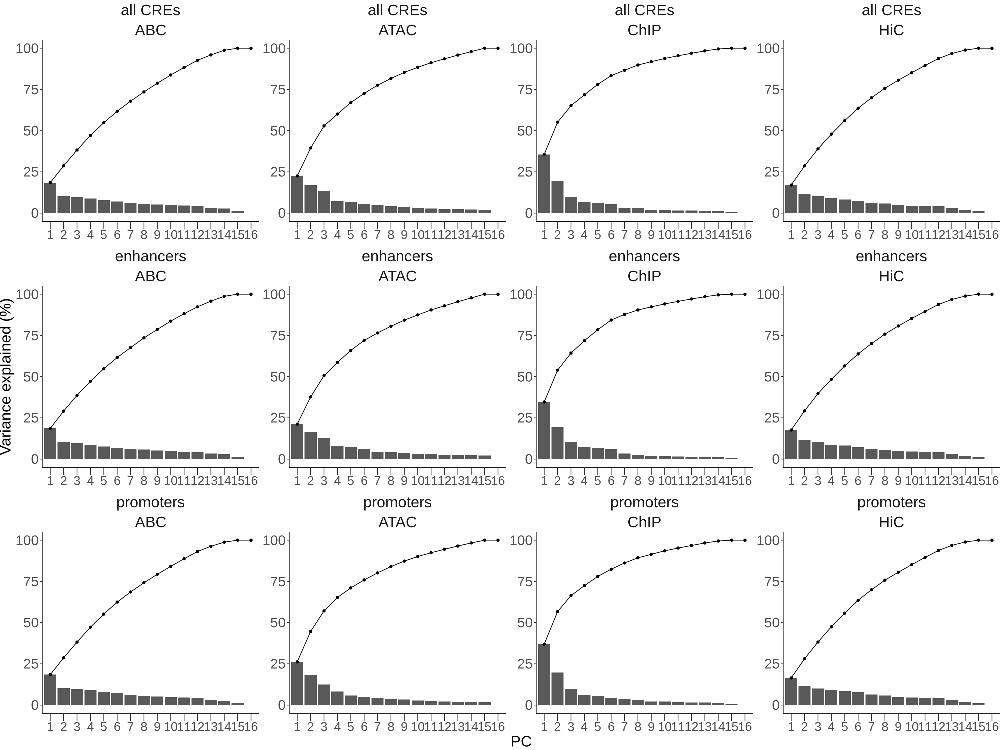

In [41]:
options(repr.plot.width = 20, repr.plot.height = 15, repr.plot.res = 200)
pca_abc$evplot

Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 13 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


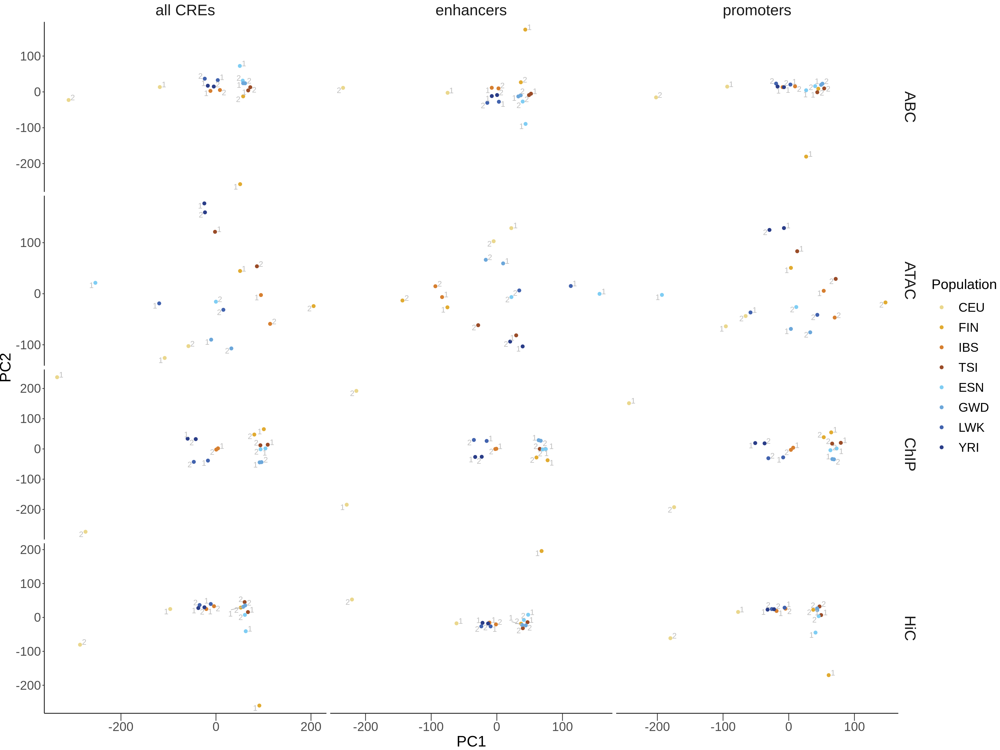

In [42]:
pca_abc$pcaplot

Warning message:
“ggrepel: 9 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 4 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 5 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 3 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 7 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 11 unlabeled data points (too many overlaps). Consider increasing max.overlaps”
Warning message:
“ggrepel: 2 unlabeled data points (too many overlaps). Consider increasing max.overlaps”


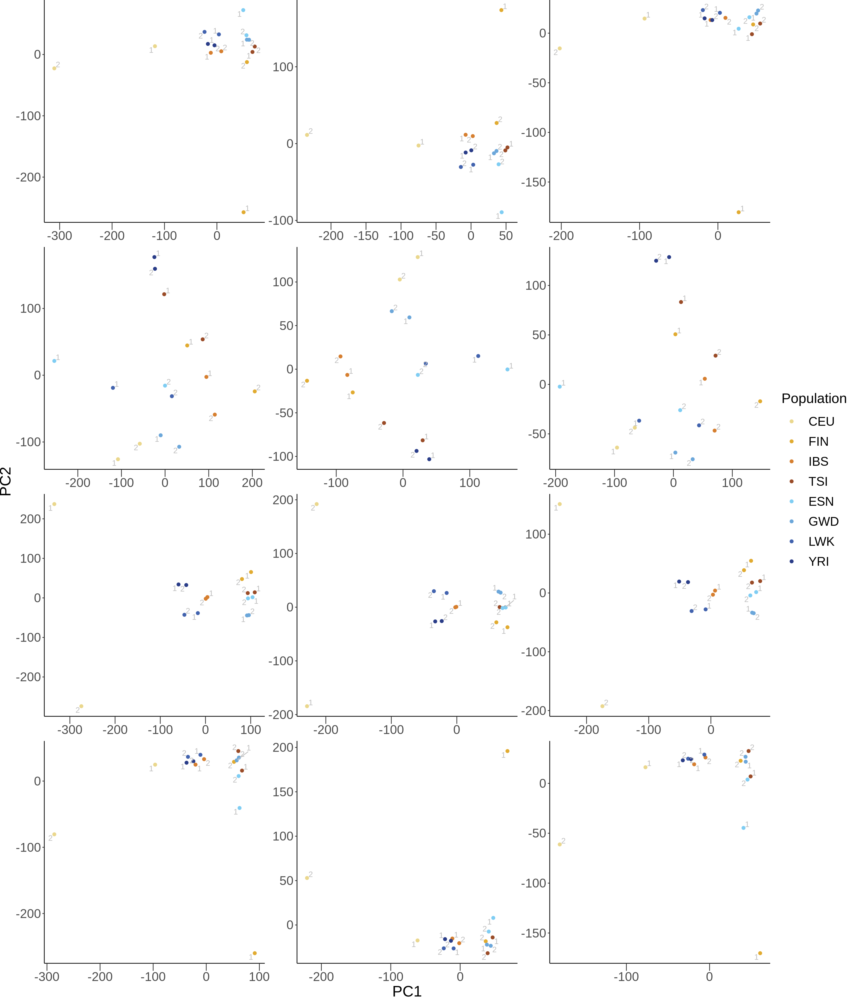

In [43]:
options(repr.plot.width = 17, repr.plot.height = 20, repr.plot.res = 200)

pca_abc$scores %>%  
    ggplot(aes(x = PC1, y = PC2, color=hex)) +
    geom_point(size=2) + 
    scale_color_identity(breaks=pca_abc$scores$hex, labels=pca_abc$scores$population, guide='legend') +  
    labs(color='Population') + 
    ggrepel::geom_text_repel(
            aes(label=replicate, color='gray'),
            size=4,
            show.legend=FALSE,
            box.padding=.075
        ) + 
    theme_classic() + 
    facet_wrap(vars(CRE_type, score_type), nrow=4, dir='v', scales='free') + 
    theme(axis.text.x = element_text(size=18),
          axis.text.y = element_text(size=18),
          axis.ticks.length.x = unit(0.75, "line"),
          axis.title.x = element_text(size=22),
          axis.title.y = element_text(size=22),
          legend.position = 'right',
          legend.title = element_text(size=20),
          legend.text = element_text(size=18),
          legend.key.size = unit(2.0, "line"),
          legend.background = element_rect(fill = "transparent",colour = NA),
          legend.box.background = element_rect(fill = "transparent",colour = NA),
              strip.background = element_blank(),
              strip.placement = "outside",
#               strip.text = element_text(size=22),
              strip.text = element_blank(),
          panel.background = element_rect(fill = "transparent",colour = NA),
          plot.title=element_text(size=24),
          plot.background = element_rect(fill = "transparent",colour = NA),
          plot.margin = unit(c(0,0,0,0),"line"))

if (save_figs) {
    ggsave(
        file.path(
            outdir, 
            'FigS1b.png'
        ),
        width=17, 
        height=20
    )
}

# Fig. 1

## c

In [44]:
pca_abc$scores

sample,population,replicate,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,PC11,PC12,PC13,PC14,PC15,PC16,ancestry,hex,porder,CRE_type,score_type
<fct>,<fct>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<int>,<chr>,<chr>
CEU_rep2,CEU,2,-310.1893592,-22.626830,68.5717657,-105.6081883,15.401948,-6.4329300,-9.2101585,2.96170244,5.5374119,-8.0159090,-2.827213e+00,-2.5181867,-0.4469248,2.3738990,-0.23596608,1.459943e-14,EUR,#EAD78D,16,all CREs,ABC
CEU_rep1,CEU,1,-118.2007243,13.505348,-69.3494186,128.6273982,-34.254325,15.4421001,25.8761537,-48.19824934,-49.8811114,101.0303108,2.596169e+01,-4.9396645,39.7728645,-14.3422461,-2.44484440,2.116363e-15,EUR,#EAD78D,15,all CREs,ABC
FIN_rep2,FIN,2,57.2430070,-12.412478,-26.2513832,-36.0346642,7.901362,-34.9360994,-41.9582822,-56.04204365,20.7383323,-26.6400777,3.361178e+01,-136.3194565,46.8514159,24.4653403,2.30689484,5.259682e-15,EUR,#E1AB31,14,all CREs,ABC
FIN_rep1,FIN,1,50.8725073,-257.342879,38.6249360,39.0131349,13.283335,5.4034982,9.0644620,22.92175179,1.8341753,6.5812660,-9.526911e-01,10.5776291,0.4303371,-1.1625678,0.44721747,-1.298961e-14,EUR,#E1AB31,13,all CREs,ABC
IBS_rep2,IBS,2,8.3351690,5.212033,-39.9533248,4.3052742,5.471950,-18.3030598,-20.0083669,-32.05907452,7.2112747,-16.4934703,-4.956469e+00,-29.7154475,-86.3178870,-107.1906677,2.96030741,9.566133e-15,EUR,#D67F30,12,all CREs,ABC
IBS_rep1,IBS,1,-11.6546263,2.769739,-47.8990423,38.0543959,-7.699960,-13.3505144,-19.0117623,-88.11955759,12.6410108,-117.5745753,-2.080309e+01,84.2401453,46.6108118,-2.4102600,0.56502572,2.055300e-14,EUR,#D67F30,11,all CREs,ABC
TSI_rep2,TSI,2,72.1954225,12.983757,-14.3847706,-68.6482450,-11.965975,-30.9912345,-146.1942020,34.08550041,-88.5379156,41.8659091,9.214530e+00,46.3228606,10.1332759,1.1245440,1.00387685,4.725387e-15,EUR,#9A4C28,10,all CREs,ABC
TSI_rep1,TSI,1,67.8453493,4.113192,9.9243324,-95.2854577,-187.434692,65.9219215,57.5710790,-6.34349210,13.3915530,8.2254259,3.438503e+00,7.6295346,5.0091874,-6.2197404,0.35105267,-1.249001e-15,EUR,#9A4C28,9,all CREs,ABC
ESN_rep2,ESN,2,56.3870964,31.397140,10.6036608,-37.8117209,120.494754,179.3765844,10.5274319,-22.39488573,-14.1910228,7.8837368,2.044167e+00,3.1558652,5.5492589,-1.4138476,0.14854294,-3.731737e-14,AFR,#7FCDF3,8,all CREs,ABC


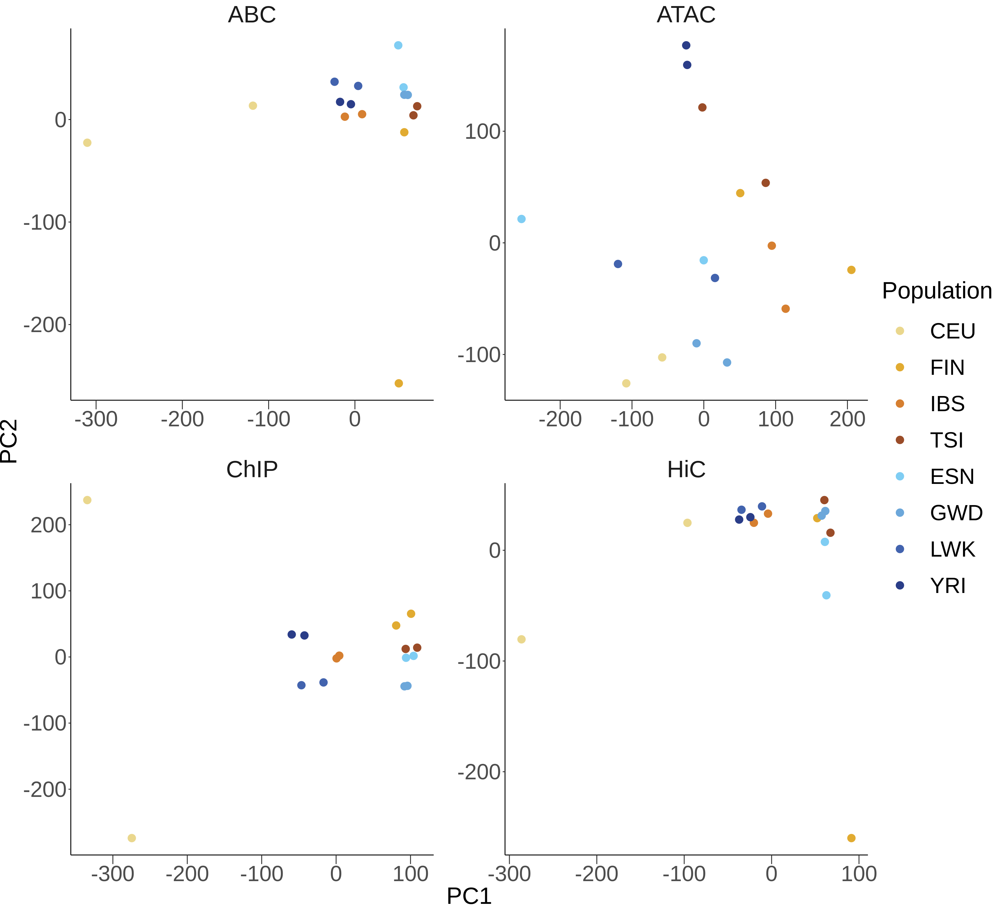

In [68]:
options(repr.plot.width = 16.5, repr.plot.height = 15, repr.plot.res = 200)

titlesize <- 28
textsize <- 26

pca_abc$scores %>% 
    filter(CRE_type=='all CREs') %>% 
    ggplot(aes(x = PC1, y = PC2, color=hex)) +
    geom_point(size=4) + 
#     ggrepel::geom_text_repel(
#             aes(label=replicate, 
# #                 color='gray'
#                ),
#             size=5,
#             show.legend=FALSE,
#             box.padding=.09
#         ) + 
    scale_color_identity(breaks=pca_abc$scores$hex, labels=pca_abc$scores$population, guide='legend') +  
    labs(color='Population') + 
    theme_classic() + 
    facet_wrap(vars(score_type), nrow=2, dir='h', scales='free') + 
    theme(axis.text.x = element_text(size=textsize),
          axis.text.y = element_text(size=textsize),
          axis.ticks.length.x = unit(0.75, "line"),
          axis.title.x = element_text(size=titlesize),
          axis.title.y = element_text(size=titlesize),
          legend.position = 'right',
          legend.title = element_text(size=titlesize),
          legend.text = element_text(size=textsize),
          legend.key.size = unit(3.0, "line"),
          legend.background = element_rect(fill = "transparent",colour = NA),
          legend.box.background = element_rect(fill = "transparent",colour = NA),
              strip.background = element_blank(),
              strip.placement = "outside",
#               strip.text = element_text(size=22),
              strip.text = element_text(size=titlesize),
          panel.background = element_rect(fill = "transparent",colour = NA),
          panel.spacing = unit(2, 'line'),
          plot.title=element_text(size=titlesize),
          plot.background = element_rect(fill = "transparent",colour = NA),
          plot.margin = unit(c(0,0,0,0),"line"))

if (save_figs) {
    ggsave(
        file.path(
            outdir, 
            'Fig1c.png'
        ),
        width=16.5, 
        height=15
    )
}

In [46]:
if (pca_only) stop('Not run: heatmaps')

# heatmap function

In [47]:
sampScoreHeatmap <- function(df, 
                             score_column='ABC.Score', 
                             cre_types=c('promoter','enhancer'), 
                             top_abc=FALSE,
                             diff_cres=FALSE,
                             top_diff=FALSE,
                         bqtl=FALSE,
                         bqtl_direction=FALSE,
                             cre_type_first=TRUE,
                             plotlog=FALSE,
                             hic_filt=FALSE,
                             scaledir='none',
                             zscore=FALSE,
                             topvar=NULL,
                             ordervar='mean_score',
                             cluster_cols=FALSE,
                             showlegend=TRUE,
                             cv_exclude_pop=NULL,
                             showtitle=FALSE,
                             debug=FALSE) {
    
    ptitle <- gsub("\\."," ", score_column)
    cscore_type <- str_split(score_column, '\\.', simplify=TRUE)[1]
    cscore_pcol <- paste0(cscore_type, '_p')
    cscore_lfccol <- paste0(cscore_type, '_lfc')
    
    sampinfo <- df %>% 
        select(population,ancestry,sample) %>% 
        distinct() %>% 
        column_to_rownames("sample")
    
    abcw <- df %>% 
        mutate(egpair = paste(name, TargetGene, sep=';'),
               CRE_type = if_else(class=='promoter','promoter','enhancer'))
    
    if (cre_type_first) {
        print('    CRE type filtering')
        abcw <- abcw %>% 
            dplyr::filter(CRE_type %in% cre_types)
    }
    
    if (hic_filt) {
        
        abcw <- abcw %>% 
            # for compatibility with previous bug, 
            # remove NA hic_estimates for all score types
            group_by(egpair) %>% 
            filter(all(!is.na(hic.Score)))
        
    }
    
    if (top_abc) {
        
        abcw <- abcw %>% 
            group_by(egpair) %>% 
            mutate(mean_ABC = mean(ABC.Score, na.rm=TRUE)) %>% 
            group_by(sample, TargetGene) %>% 
            arrange(desc(mean_ABC), .by_group=TRUE) %>% 
            slice(1)
        
    }
    
    abcw <- abcw %>% 
        ungroup() %>% 
        rename(test.Score := {{score_column}},
               test.p := {{cscore_pcol}},
                test.lfc := {{cscore_lfccol}})
    
    if (diff_cres) {
        print('    filtering to diff pairs')
        print(paste0('        ', nrow(abcw)))
        abcw <- abcw %>% 
            filter(test.p < 0.05)
        print(paste0('        ', nrow(abcw)))
    }

    if (bqtl) {
                
        abcw <- abcw %>% 
            filter(bqtl_p < 0.05)

        if (grepl('chip', score_column) | grepl('hic', score_column)) {
          # only count each HiChIP bin once
          abcw <- abcw %>%
                group_by(sample, TargetGene, name) %>%
                arrange(bqtl_p, .by_group=TRUE) %>%
                slice(1) %>%
                ungroup() %>%
                group_by(sample, TargetGene, test.lfc, ABC_p) %>%
                mutate(chipbin_has_promoter = if_else(any(class=='promoter'), TRUE, FALSE))

            # take the CRE with the most significant QTL in the HiChIP bin
            abcw <- abcw %>%
                arrange(bqtl_p, .by_group=TRUE) %>%
                slice(1) %>%
                ungroup()
        }

    } else if (top_diff) {

        print('    filtering to top-diff pairs')
        abcw <- abcw %>% 
            group_by(sample, TargetGene) %>% 
            arrange(test.p) %>% 
            slice(1) %>% 
            ungroup()

    }

    if (!cre_type_first) {

        print('    CRE type filtering')

        if (length(cre_types)==1 
                & bqtl 
                & (grepl('chip', score_column) | grepl('hic', score_column))) {

            if (cre_types=='promoter') {
                abcw <- abcw %>% dplyr::filter(chipbin_has_promoter)
            } else if (cre_types=='enhancer') {
                abcw <- abcw %>% dplyr::filter(!chipbin_has_promoter)
            }

        } else {
            abcw <- abcw %>% 
                dplyr::filter(CRE_type %in% cre_types)
        }

    }
    
    if (bqtl) {
        
        # take the most significantly differential E-G pair per CRE
        abcw <- abcw %>% 
            group_by(sample, name) %>% 
            arrange(bqtl_p, test.p, .by_group=TRUE) %>% 
            slice(1) %>% 
            ungroup()

        if (bqtl_direction) {
            abcw <- abcw %>% 
                filter((test.lfc > 0 & bqtl_direction=='up') 
                          | (test.lfc < 0 & bqtl_direction=='down'))
        }
        
    }
    
    abcw <- abcw %>% 
        select(sample, CRE_type, egpair, test.Score) %>% 
        group_by(egpair) %>% 
        mutate(mean_score=mean(test.Score, na.rm=TRUE))
    
    # allow coefficient of variance calculation for E-G pair inclusion filtering
    # to exclude single pop/sample that could driving the top CV pairs
    if (!is.null(cv_exclude_pop)) {
        abcw <- abcw %>% 
            mutate(test_cv = sd(test.Score[population!=cv_exclude_pop], na.rm=TRUE)/mean(test.Score[population!=cv_exclude_pop], na.rm=TRUE))
    } else {
        abcw <- abcw %>% 
            mutate(test_cv = sd(test.Score, na.rm=TRUE)/mean_score)
    }

    
    if (zscore) {
        abcw <- abcw %>% 
            mutate(test.Score = (test.Score - mean_score)/sd(test.Score, na.rm=TRUE))
    }
    
    abcw <- abcw %>% 
        ungroup() %>% 
        pivot_wider(names_from = sample,
                    values_from = test.Score) %>% 
        filter(if_all(everything(), ~ !is.na(.)))
    
    if (!is.null(topvar)) {
        
        abcw <- abcw %>% 
            arrange(desc(test_cv)) %>% 
            head(topvar)
        
    }
    
    abcw <- abcw %>% 
        arrange(desc(.data[[ordervar]]))
    
    if (debug) return(abcw)
    
    # annotate columns by CRE type
    eginfo <- abcw %>% 
        select(egpair, CRE_type) %>% 
        column_to_rownames("egpair")
    
    if (length(cre_types)==1) {
#         eginfo <- NA
        ptitle <- paste(cre_types, ptitle)
    }
    
    abcw <- abcw %>% 
        select(-c(CRE_type, mean_score, test_cv))
    
    abcwt <- abcw %>% 
        column_to_rownames("egpair") %>% 
        as.matrix() %>% 
        t()
    
    # set colors and legend order
    pclrs <- popPlotColors(pops=unique(sampinfo$population))
    r1colors <- pclrs %>% 
        dplyr::filter(replicate=='rep1') %>% 
        select(-replicate)
    
    sampinfo <- sampinfo %>% 
        mutate(population = factor(population, levels=r1colors$population))
    
    popcolorv <- r1colors %>% pull(hex)
    names(popcolorv) <- r1colors %>% pull(population)
    
    abccolors <- list(
        population = popcolorv,
        ancestry = c(AFR = "#2E3191", EUR = "#F05A28"),
        CRE_type = c(promoter = "#739893", enhancer = "#DF241B")
    )
    
    # annotate rows by ancestry and population
    # may not be necessary, but ensure same ordering going in
    sampinfo <- sampinfo[rownames(abcwt),]
    
    if (plotlog) abcwt <- log(abcwt)
    if (!showtitle) ptitle <- NA
    
    ph <- pheatmap::pheatmap(abcwt,
                             color=colorRampPalette(RColorBrewer::brewer.pal(n = 9, name = "PRGn"))(100),
                             main=ptitle, 
                             show_colnames=FALSE,
                             cluster_cols=cluster_cols,
                             annotation_col=eginfo,
                             annotation_row=sampinfo,
                             annotation_colors=abccolors,
                             fontsize=18,
                             scale=scaledir,
                             annotation_legend=showlegend,
                             annotation_names_row=FALSE,
                             annotation_names_col=FALSE)
    
    return(ph)
        
}

In [48]:
# tp <- sampScoreHeatmap(abc, 
#                             score_column='atac.Score', 
#                             debug=TRUE, 
#                             plotlog=TRUE,
#                             cre_type=c('enhancer','promoter'),
#                             scaledir='none',
#                         cv_exclude_pop=cv_exclude_pop,
#                         zscore=zscore, 
#                            topvar=NULL,
#                            cluster_cols=colClust)
# head(tp)

In [49]:
# cre_colors <- c("#DF241B","#739893")

# plotCorrelation(tp %>% 
#                     arrange(desc(CRE_type)),
#                 'mean_score',
#                 'test_cv',
#                 xangle=0,
#                 groupvar='CRE_type',
#                 colorvals=cre_colors,
#                 addline=NULL, # c(intercept, slope)
#                 legendpos="right",
#                 corrpos=c(1e-4,.012),
#                 corrcolor='black',
#                 w=9,h=7,
#                 logscale=TRUE,
#                 xlogonly=FALSE,
#                 facets=NULL,
#                 fscales='fixed', # free, free_x, free_y
#                 frows=2,
#                 fdir='h',
#                 orderpval=FALSE,
#                 addaxes=FALSE,
#                 debug=FALSE)

[1] "    CRE type filtering"


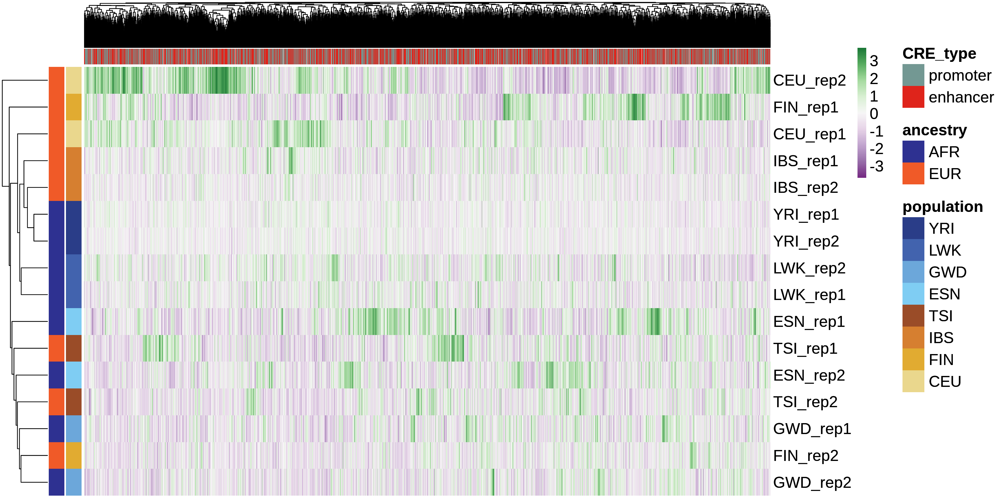

In [50]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_abc <- sampScoreHeatmap(abcp, 
                           score_column='ABC.Score',
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                           debug=FALSE, 
                           plotlog=FALSE, 
                           scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=TRUE)
ph_abc

In [51]:
names(ph_abc)

[1] "tree_row" "tree_col" "kmeans"   "gtable"

In [52]:
colorRampPalette(rev(RColorBrewer::brewer.pal(n = 9, name = "Greens")))(100)

[1] "#00441B" "#00471C" "#004A1D" "#004D1F" "#005120" "#005421" "#005723"
  [8] "#005B24" "#005E25" "#006127" "#006528" "#00682A" "#006B2B" "#016E2D"
 [15] "#04702F" "#077331" "#0A7533" "#0D7835" "#0F7A37" "#127D39" "#157F3B"
 [22] "#18813D" "#1B843F" "#1E8641" "#208943" "#238B45" "#268E47" "#289049"
 [29] "#2A934B" "#2D954D" "#2F984F" "#329B51" "#349D53" "#37A055" "#39A256"
 [36] "#3BA558" "#3EA85A" "#40AA5C" "#44AC5E" "#48AE60" "#4CB062" "#50B264"
 [43] "#55B466" "#59B668" "#5DB86A" "#61BA6C" "#65BC6E" "#69BE70" "#6DC072"
 [50] "#71C274" "#75C477" "#79C67A" "#7DC87D" "#80C980" "#84CB83" "#88CD86"
 [57] "#8BCF89" "#8FD08C" "#92D28F" "#96D492" "#9AD595" "#9DD798" "#A1D99B"
 [64] "#A4DA9E" "#A7DBA1" "#AADDA4" "#ADDEA7" "#B0DFAA" "#B3E0AD" "#B6E2B0"
 [71] "#B9E3B3" "#BDE4B6" "#C0E6B9" "#C3E7BC" "#C6E8BF" "#C8E9C1" "#CBEAC4"
 [78] "#CDEBC7" "#D0ECC9" "#D2EDCC" "#D4EECE" "#D7EFD1" "#D9F0D4" "#DCF1D6"
 [85] "#DEF2D9" "#E1F3DB" "#E3F4DE" "#E5F5E0" "#E7F5E2" "#E8F6E4" "#E9F6E5"
 [92] "#EBF7E7" "#ECF8E9" "#EEF8EA" "#EFF9EC" "#F1F9EE" "#F2FAEF" "#F4FAF1"
 [99] "#F5FBF3" "#F7FCF5"

[1] "    CRE type filtering"


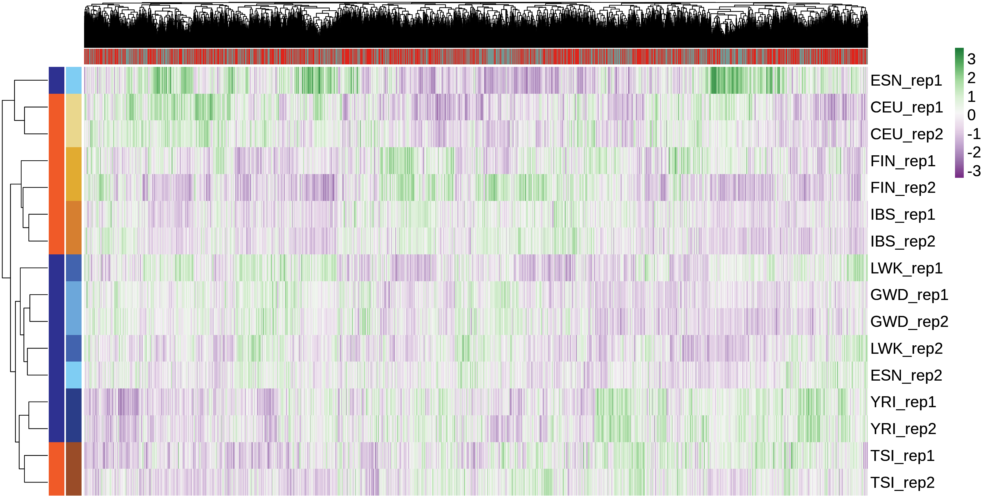

In [53]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_atac <- sampScoreHeatmap(abcp, 
                            score_column='atac.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE, 
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_atac

[1] "    CRE type filtering"


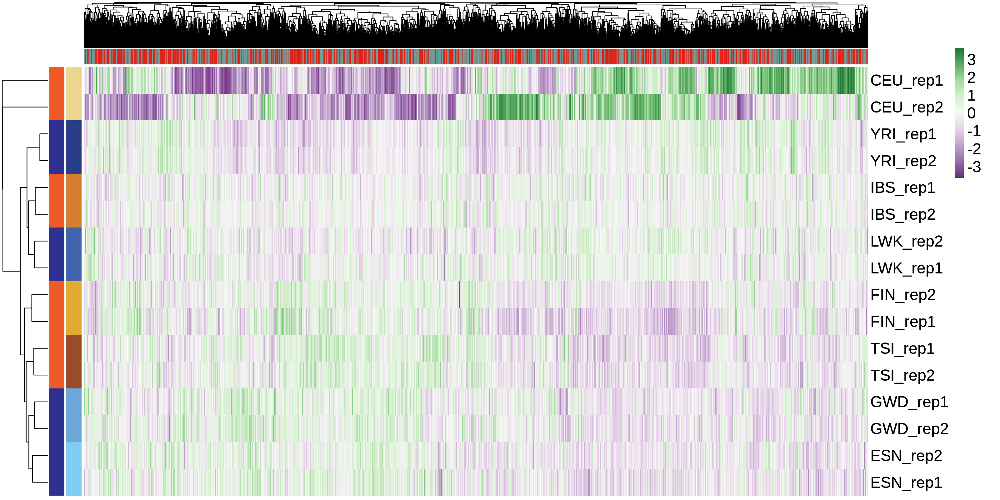

In [54]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_chip <- sampScoreHeatmap(abcp, 
                            score_column='chip.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE, 
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_chip

[1] "    CRE type filtering"


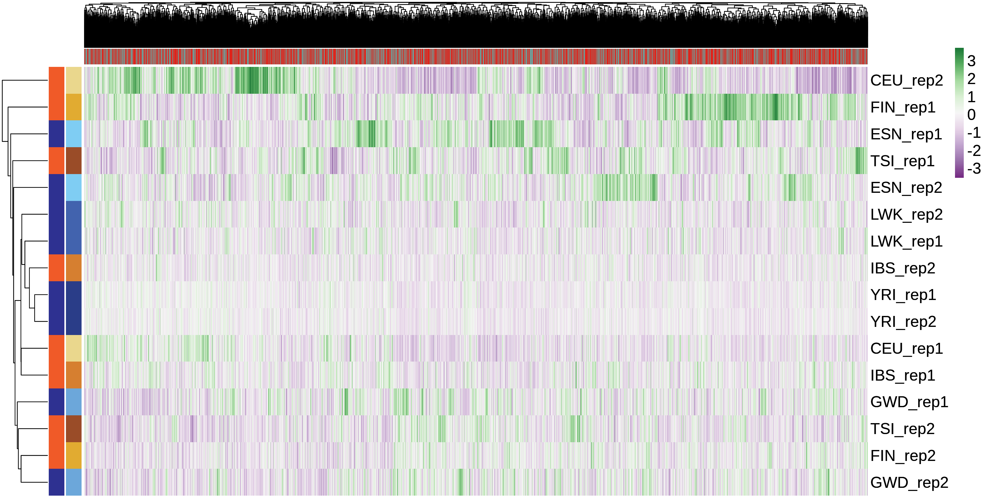

In [55]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_hic <- sampScoreHeatmap(abcp, 
                            score_column='hic.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE, 
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_hic

[1] "    CRE type filtering"


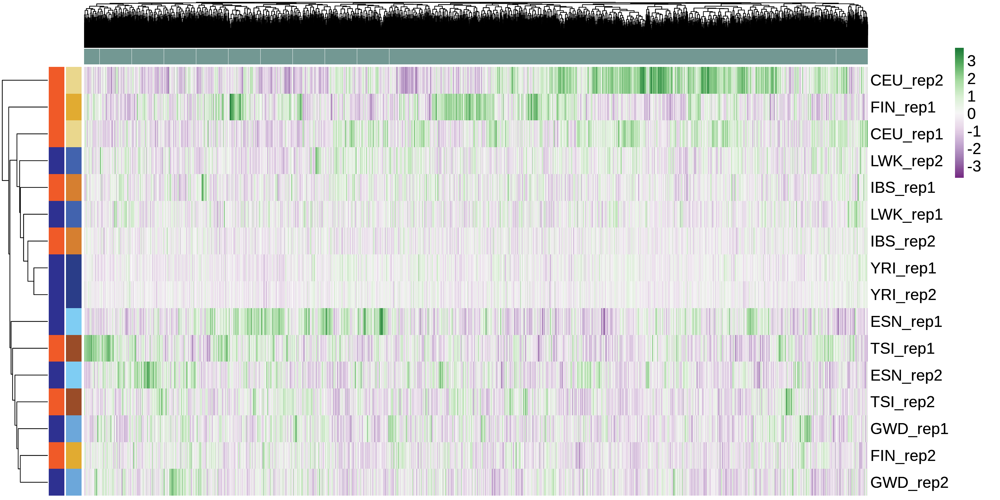

In [56]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_abcp <- sampScoreHeatmap(abcp, 
                            score_column='ABC.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='promoter',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_abcp

[1] "    CRE type filtering"


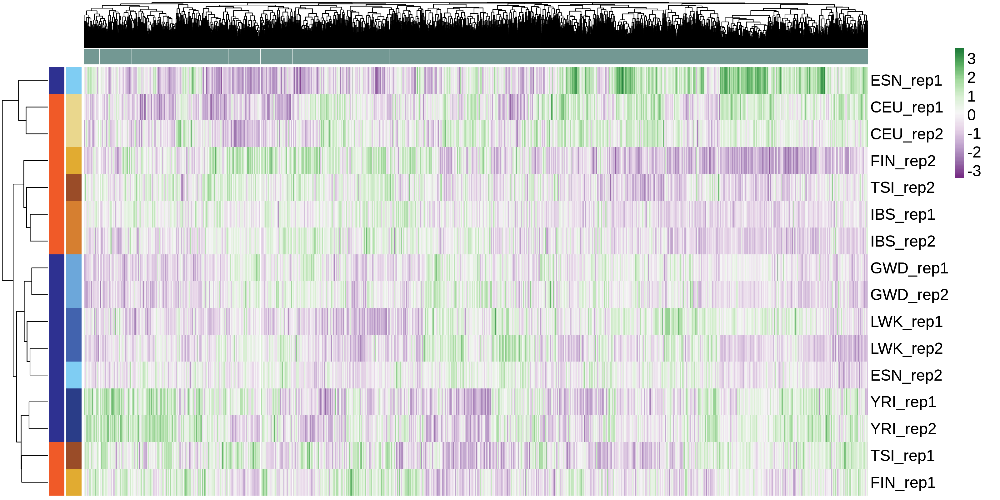

In [57]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_atacp <- sampScoreHeatmap(abcp, 
                            score_column='atac.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='promoter',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_atacp

[1] "    CRE type filtering"


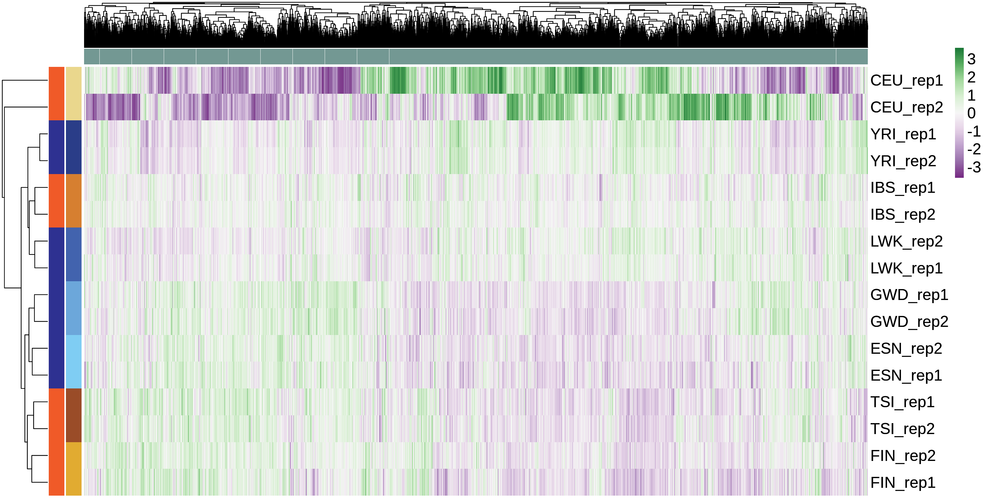

In [58]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_chipp <- sampScoreHeatmap(abcp, 
                            score_column='chip.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='promoter',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_chipp

[1] "    CRE type filtering"


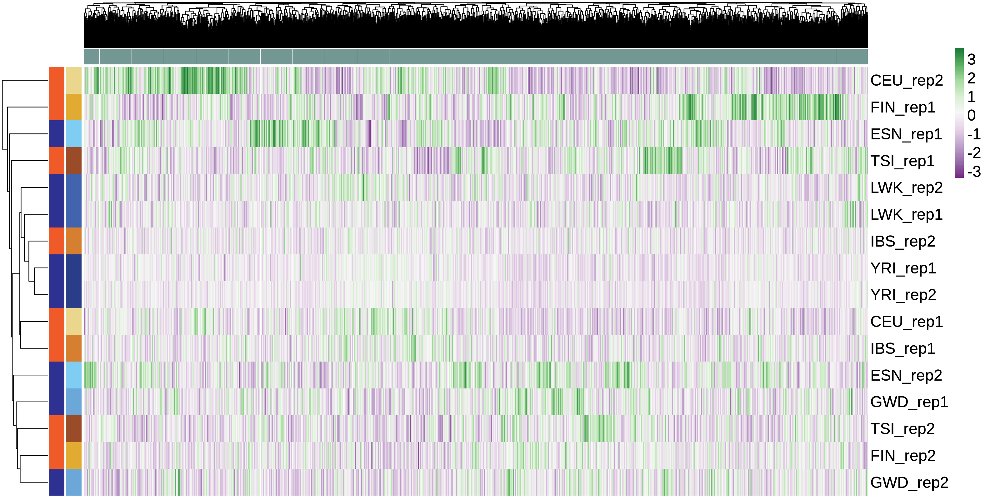

In [59]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_hicp <- sampScoreHeatmap(abcp, 
                            score_column='hic.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='promoter',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_hicp

[1] "    CRE type filtering"


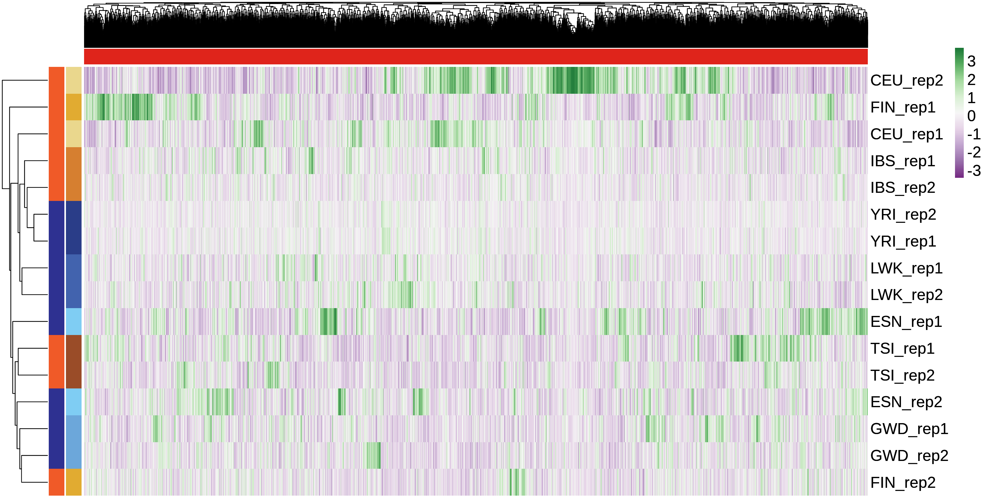

In [60]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_abce <- sampScoreHeatmap(abcp, 
                            score_column='ABC.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='enhancer',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_abce

[1] "    CRE type filtering"


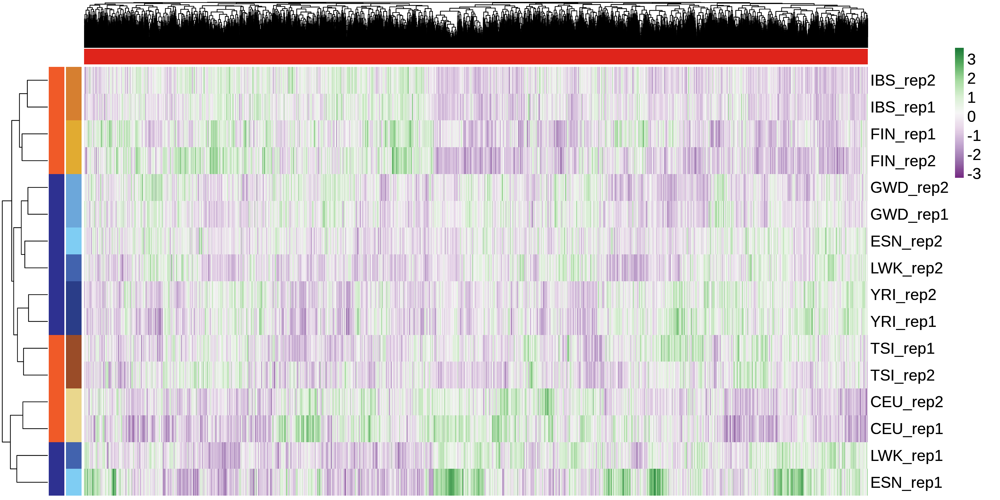

In [61]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_atace <- sampScoreHeatmap(abcp, 
                            score_column='atac.Score',
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first, 
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='enhancer',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_atace

[1] "    CRE type filtering"


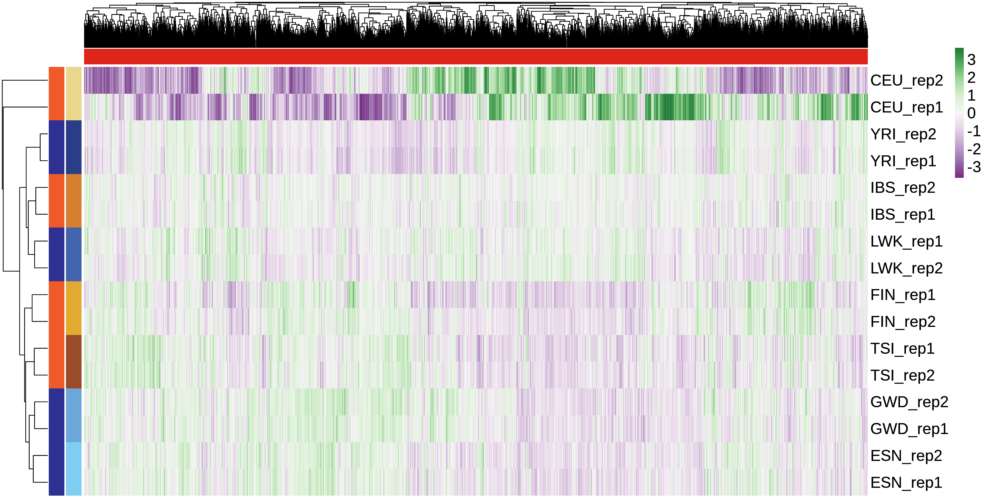

In [62]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_chipe <- sampScoreHeatmap(abcp, 
                            score_column='chip.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='enhancer',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_chipe

[1] "    CRE type filtering"


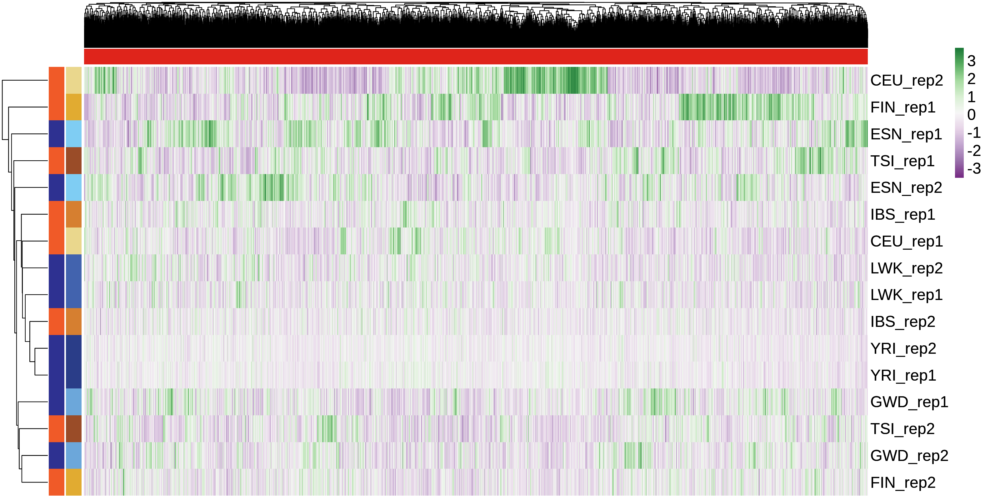

In [63]:
options(repr.plot.width = 16, repr.plot.height = 8, repr.plot.res = 200)
ph_hice <- sampScoreHeatmap(abcp, 
                            score_column='hic.Score', 
                             diff_cres=diff_cres,
                             top_diff=top_diff,
                             cre_type_first=cre_type_first,
                        bqtl=bqtl,
                        bqtl_direction=bqtl_direction,
                            debug=FALSE, 
                            plotlog=FALSE,
                            cre_type='enhancer',
                            scaledir=scale_direction, 
                        zscore=zscore,
                           topvar=topvarN,
                           cluster_cols=colClust,
                        cv_exclude_pop=cv_exclude_pop,
                           showlegend=FALSE)
ph_hice

In [64]:
names(ph_chipe)

[1] "tree_row" "tree_col" "kmeans"   "gtable"

In [65]:
lm <- cbind(seq(1,4),
            seq(5,8),
            seq(9,12))
lm

1,5,9
2,6,10
3,7,11
4,8,12


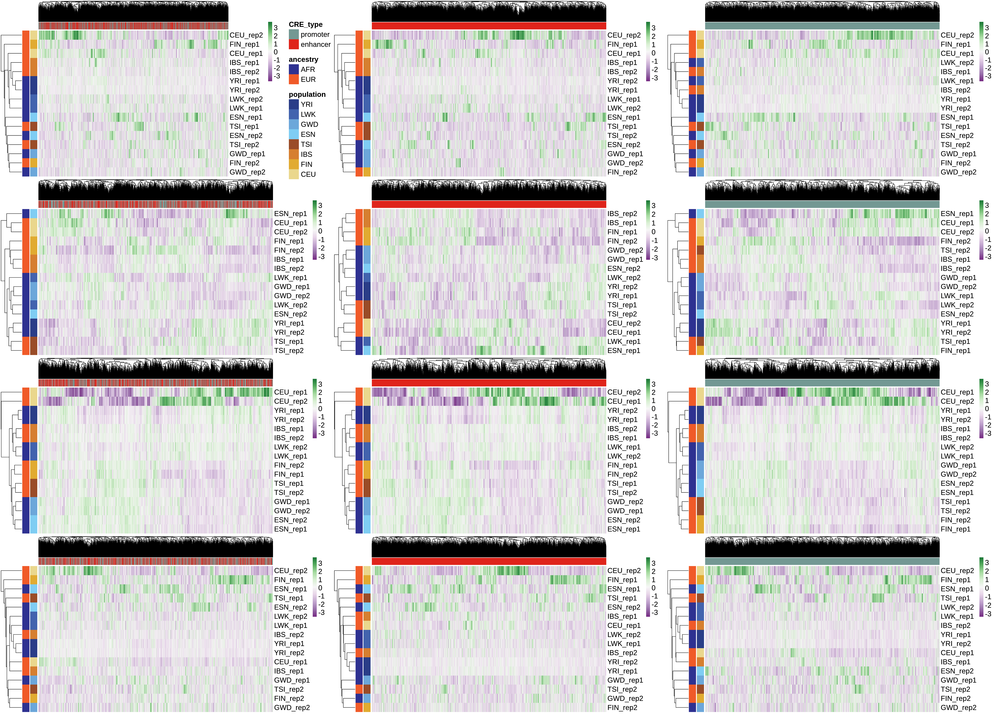

In [66]:
# g1 <- gridExtra::grid.arrange(
#       p1 + theme(plot.margin = unit(c(0,3,0,0),"line")),
#       p2 + theme(plot.margin = unit(c(0,1.5,0,0),"line")),
#       nrow = 1,
#       top = grid::textGrob(
#            gtitle,
#            gp = grid::gpar(fontsize = 26)
#       ),
#       padding = unit(3, "line")
#     )

lm <- cbind(seq(1,4),
            seq(5,8),
            seq(9,12))

grobslist <- list(
    ph_abc$gtable,
    ph_atac$gtable,
    ph_chip$gtable,
    ph_hic$gtable,
    ph_abce$gtable,
    ph_atace$gtable,
    ph_chipe$gtable,
    ph_hice$gtable,
    ph_abcp$gtable,
    ph_atacp$gtable,
    ph_chipp$gtable,
    ph_hicp$gtable
)

options(repr.plot.width = 35, repr.plot.height = 25, repr.plot.res = 200)

g1 <- gridExtra::grid.arrange(grobs = grobslist,
                                layout_matrix = lm)

grid::grid.draw(g1)

if (save_figs) {
    ggsave(
        file.path(
            outdir, 
            'FigS1c.png'
        ), 
        plot=g1, 
        width=35, 
        height=25
    )
}